The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
<class 'numpy.complex128'>
Info    : Meshing 1D...
Info    : Meshing curve 1 (Ellipse)
Info    : Done meshing 1D (Wall 0.0341507s, CPU 0.034569s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.434622s, CPU 0.436455s)
Info    : 3070 nodes 5339 elements


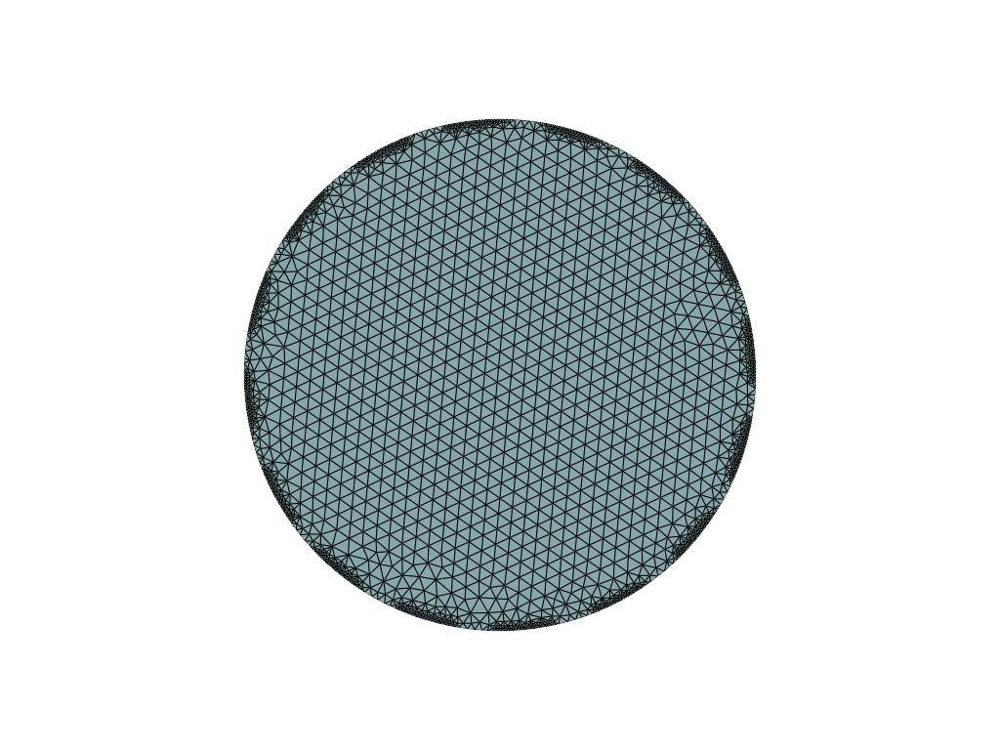

In [7]:
%load_ext autoreload
%autoreload

import dolfinx
import numpy as np
import matplotlib.pyplot as plt
import dolfinx.fem.petsc
import pandas as pd
import scipy as sp
import eitx
import ufl

from petsc4py import PETSc #Linear algebra lib
print(PETSc.ScalarType)
assert np.dtype(PETSc.ScalarType).kind == 'c'

L=16
perc=0.5
electrodes = eitx.Electrodes(L,perc,0)

mesh_refining = 0.3 #scaling factor for all domain refinement
bdr_refining = 0.4 # scaling factor for border refining

mesh_object = eitx.MeshClass(electrodes,mesh_refining,bdr_refining)
mesh_dir = mesh_object.mesh
z_values = np.full(L,0.0025+0.0025j)
dir_problem = eitx.DirectProblem(mesh_object, z_values)
I_all = eitx.current_method(L,15,method=2,value=1)
inv_problem = eitx.InverseProblem(mesh_object, z_values, I_all)

eitx.plot_mesh(mesh_dir)

In [8]:
V0 = dir_problem.V0
x = ufl.SpatialCoordinate(mesh_dir)

#defining gamma
def gamma_locator(x):
  return (x[0]+0.3)**2 + (x[1]+0.3)**2<=0.3**2
def gamma_locator_2(x):
  return (x[0]-0.3)**2 + (x[1]-0.3)**2<=0.2**2
gamma_sol = dolfinx.fem.Function(V0)
gamma_sol_cells = gamma_locator(V0.tabulate_dof_coordinates().T).astype(int)
gamma_sol_cells2 = gamma_locator_2(V0.tabulate_dof_coordinates().T).astype(int)
gamma_sol.x.array[:] = 1 + 1j + gamma_sol_cells + 2j*gamma_sol_cells2
# gamma_sol = dolfinx.fem.Function(V0)
# expr = 1+1j+ ufl.exp(-(x[0]**2+x[1]**2)/0.2) + 1j*ufl.exp(-(x[0]**2+x[1]**2)/0.2)
# gamma_sol.interpolate(dolfinx.fem.Expression(expr,V0.element.interpolation_points()))

#solving direct problem
dir_problem.set_problem(gamma_sol)
u_list, U_list = dir_problem.solve_problem_current(I_all)

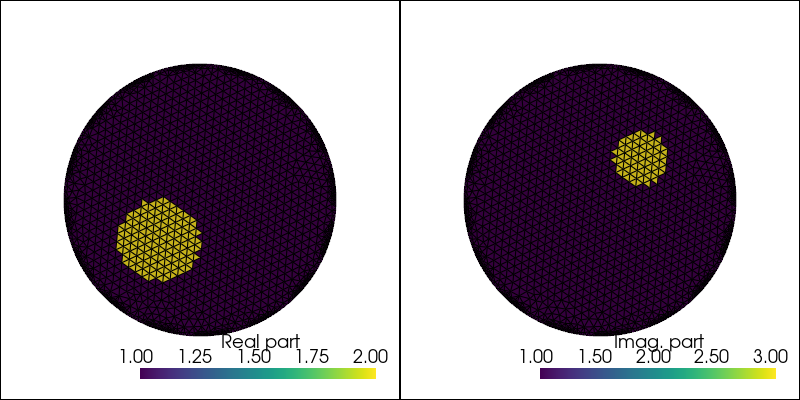

In [9]:
eitx.plot_indicator_function(gamma_sol)

Variational


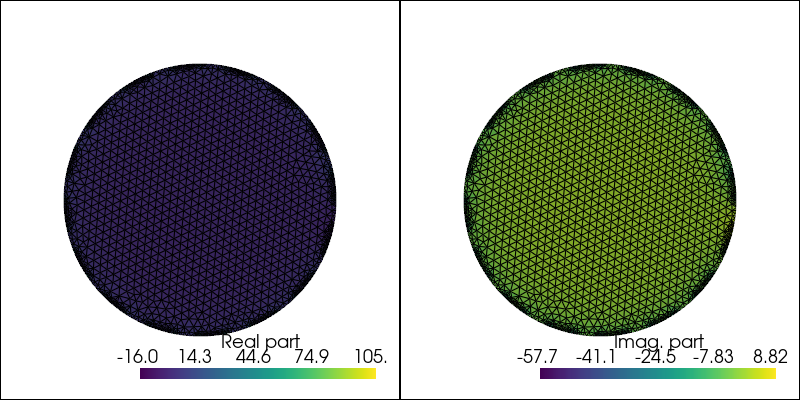

Jacobian


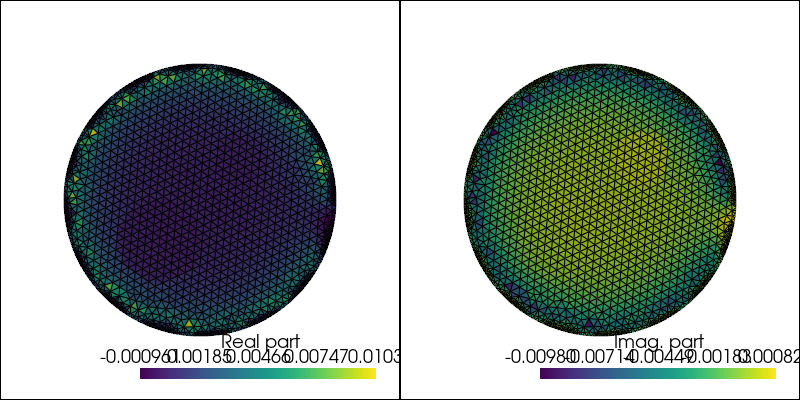

In [10]:
#defining sigma
# setting sigma_i
l = len(u_list)

sigma_list = [np.zeros(L,dtype=complex) for i in range(l)]
for i in range(l):
  sigma_list[i][i] = 1 +1j
  sigma_list[i][(2+i)%L] = -1 -1j
  # print(sigma_list[i])
sigma_array = np.array(sigma_list).flatten()

adjoint_var = dir_problem.adjoint(sigma_list, u_list)
inv_problem.set_problem(gamma_sol)

jacobian_mat = inv_problem.calc_jacobian(u_list) 
adjoint_mat = jacobian_mat.T.conj()
adjoint_jac_array = adjoint_mat @ sigma_array
adjoint_jac = dolfinx.fem.Function(V0)
adjoint_jac.x.array[:] = adjoint_jac_array

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

In [11]:
form_error = dolfinx.fem.form(ufl.inner(adjoint_var-adjoint_jac, adjoint_var-adjoint_jac)*ufl.dx)
value_error = dolfinx.fem.assemble_scalar(form_error)**0.5

form_norm = dolfinx.fem.form(ufl.inner(adjoint_var, adjoint_var)*ufl.dx)
value_norm = dolfinx.fem.assemble_scalar(form_norm)**0.5


print("L2 error norm: ",value_error)
print("L2 error norm (relative): ",value_error/value_norm)

L2 error norm:  (8.975746387064333+0j)
L2 error norm (relative):  (0.9995820028610286+0j)


Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.3458687685364692+13.999171285470739j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-9.178213744576169e-12-3.360156597409514e-11j)
Error norm= 3.483252565423006e-11
Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-0.0005184235230042626+0.01367440381824137j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (0.34535034500428674-13.9854968816861j)
Error norm= 13.989760179804591
Variational


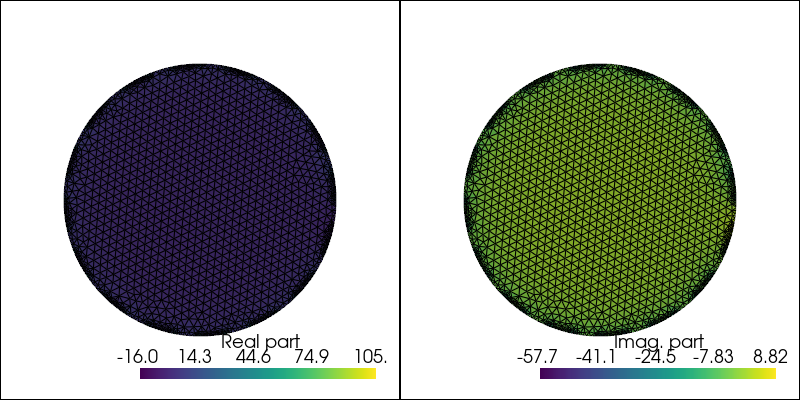

Jacobian


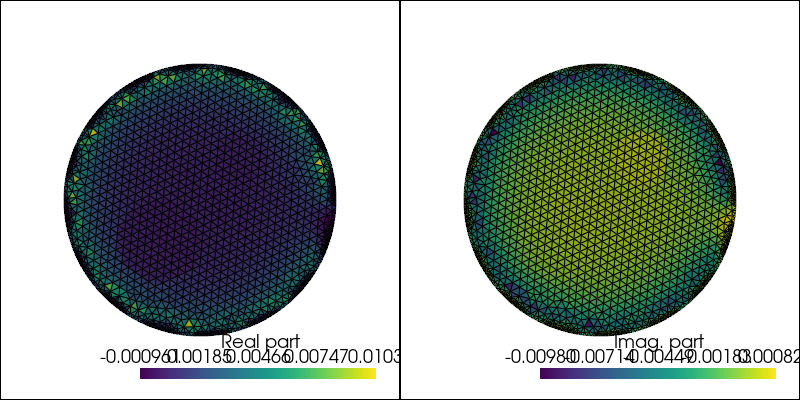

Error:


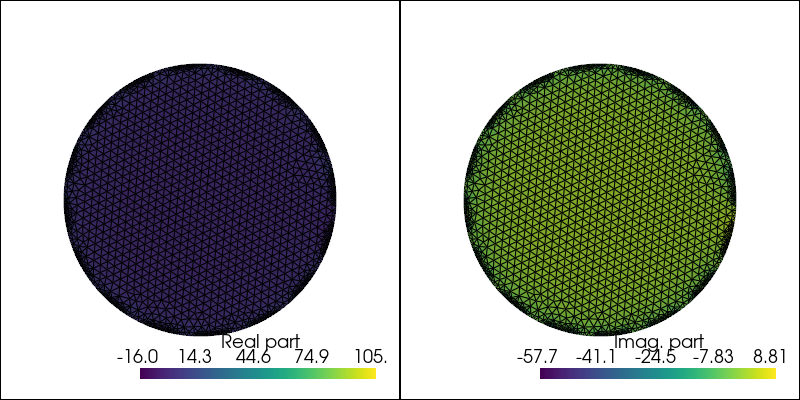

In [12]:
#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)

Correction with area array

Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.3458687685364692+13.999171285470739j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-9.178213744576169e-12-3.360156597409514e-11j)
Error norm= 3.483252565423006e-11
Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-8.02527513549524e-07+1.898088125856649e-05j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (0.3458679659997774-13.999152304623083j)
Error norm= 14.003424220451889
Variational


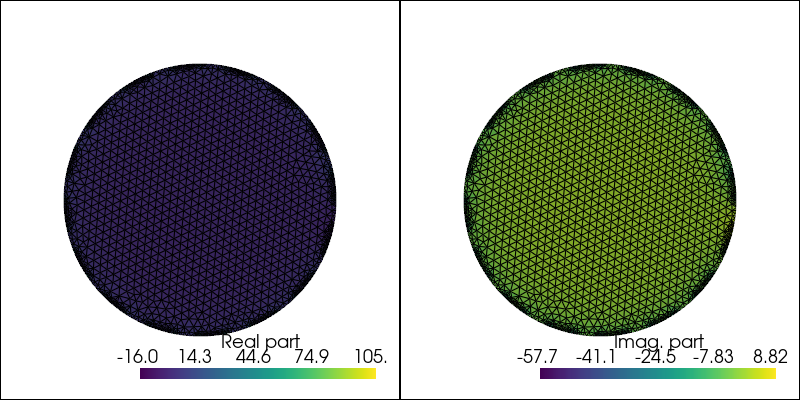

Jacobian


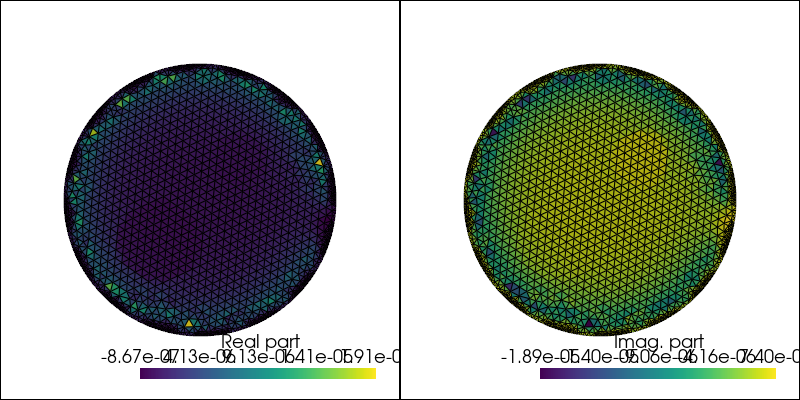

Error:


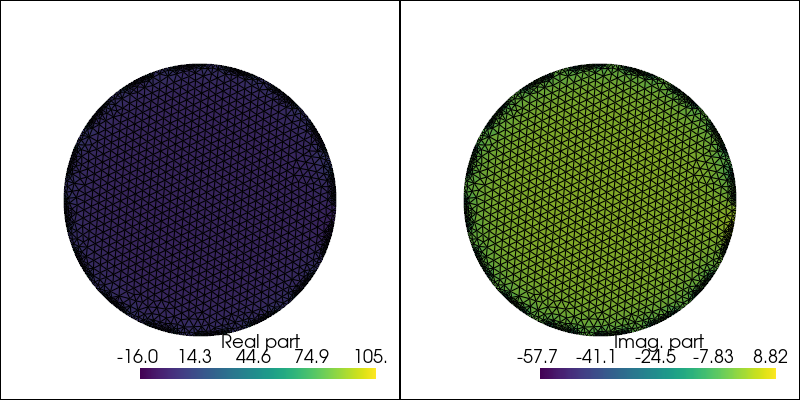

In [13]:
# using area correction
area_diag = np.diag(inv_problem.cell_area_array)
cor_adjoint_mat = area_diag @ adjoint_mat
adjoint_jac.x.array[:] = cor_adjoint_mat @ sigma_array

#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)

Correction with inverse of area array

L2 error norm:  (1.8224915191942802e-11+0j)
L2 error norm (relative):  (2.0296136325541663e-12+0j)

Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.3458687685364692+13.999171285470739j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-9.178213744576169e-12-3.360156597409514e-11j)
Error norm= 3.483252565423006e-11

Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-0.34586876853889054+13.999171285475114j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-1.1599554650132404e-11-2.922639907865232e-11j)
Error norm= 3.144411027817543e-11
Variational


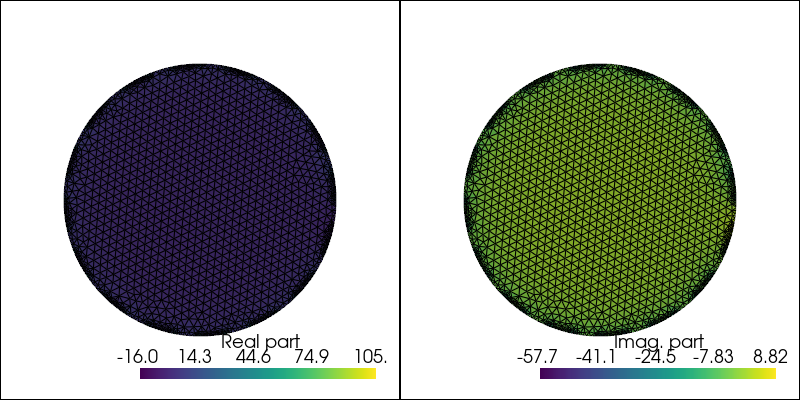

Jacobian


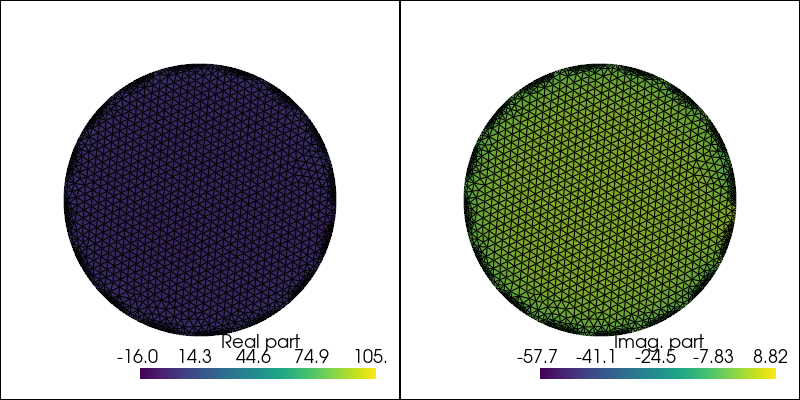

Error:


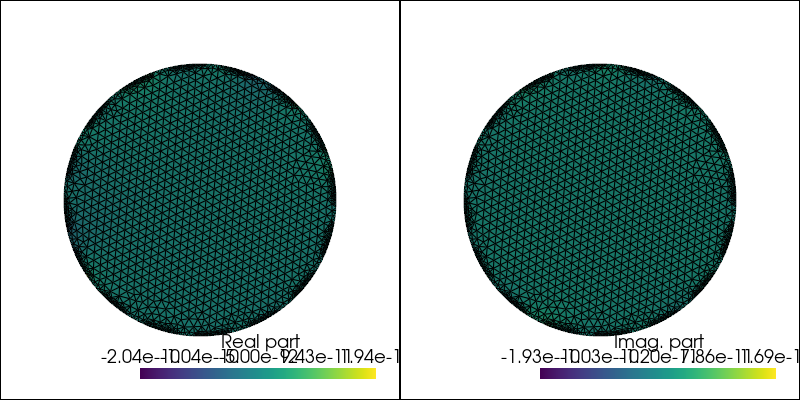

In [14]:
# using area correction
area_diag = np.diag(1/inv_problem.cell_area_array)
cor_adjoint_mat = area_diag @ adjoint_mat
adjoint_jac.x.array[:] = cor_adjoint_mat @ sigma_array

#Norm comparison
form_error = dolfinx.fem.form(ufl.inner(adjoint_var-adjoint_jac, adjoint_var-adjoint_jac)*ufl.dx)
value_error = dolfinx.fem.assemble_scalar(form_error)**0.5

form_norm = dolfinx.fem.form(ufl.inner(adjoint_var, adjoint_var)*ufl.dx)
value_norm = dolfinx.fem.assemble_scalar(form_norm)**0.5

print("L2 error norm: ",value_error)
print("L2 error norm (relative): ",value_error/value_norm)

#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("\nUsing variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("\nUsing Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)

Correction with jacobian colum norms

L2 error norm:  (8.979482817314066+0j)
L2 error norm (relative):  (0.9999981095859202+0j)

Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.3458687685364692+13.999171285470739j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-9.178213744576169e-12-3.360156597409514e-11j)
Error norm= 3.483252565423006e-11

Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-1.188699807864394e-06+4.853631641026466e-05j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (0.3458675798274831-13.999122749187931j)
Error norm= 14.00339466449499
Variational


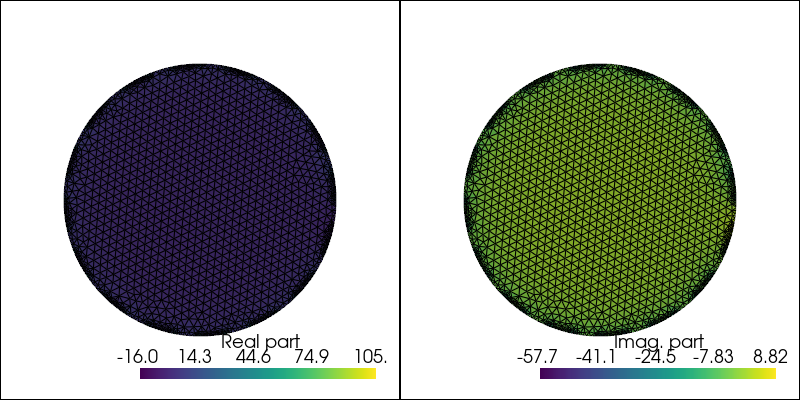

Jacobian


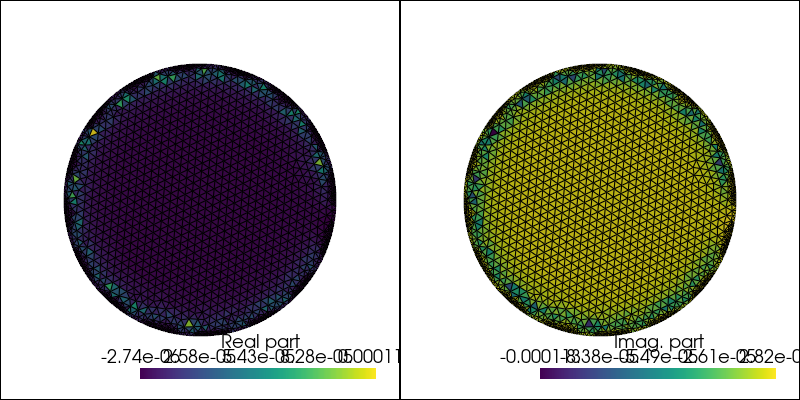

Error:


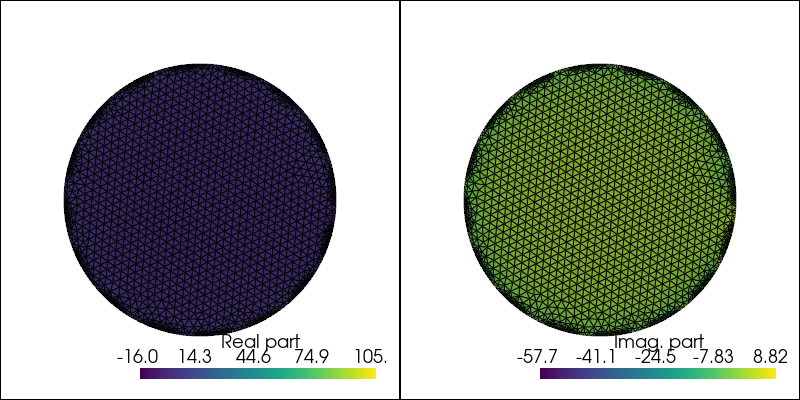

In [15]:
# using norms correction
jacobian_norms_array = np.zeros(jacobian_mat.shape[1])
for k in range(jacobian_mat.shape[1]):
    jacobian_norms_array[k] = np.linalg.norm(jacobian_mat[:,k])
    
norms_diag = np.diag(jacobian_norms_array)
cor_adjoint_mat = norms_diag @ adjoint_mat
adjoint_jac.x.array[:] = cor_adjoint_mat @ sigma_array

#Norm comparison
form_error = dolfinx.fem.form(ufl.inner(adjoint_var-adjoint_jac, adjoint_var-adjoint_jac)*ufl.dx)
value_error = dolfinx.fem.assemble_scalar(form_error)**0.5

form_norm = dolfinx.fem.form(ufl.inner(adjoint_var, adjoint_var)*ufl.dx)
value_norm = dolfinx.fem.assemble_scalar(form_norm)**0.5

print("L2 error norm: ",value_error)
print("L2 error norm (relative): ",value_error/value_norm)

#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("\nUsing variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("\nUsing Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)

Correction with inverse of jacobian colum norms

Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.3458687685364692+13.999171285470739j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-9.178213744576169e-12-3.360156597409514e-11j)
Error norm= 3.483252565423006e-11
Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-0.47036642473964624+7.721040460319121j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-0.12449765621235526-6.27813082518522j)
Error norm= 6.279365121136309
Variational


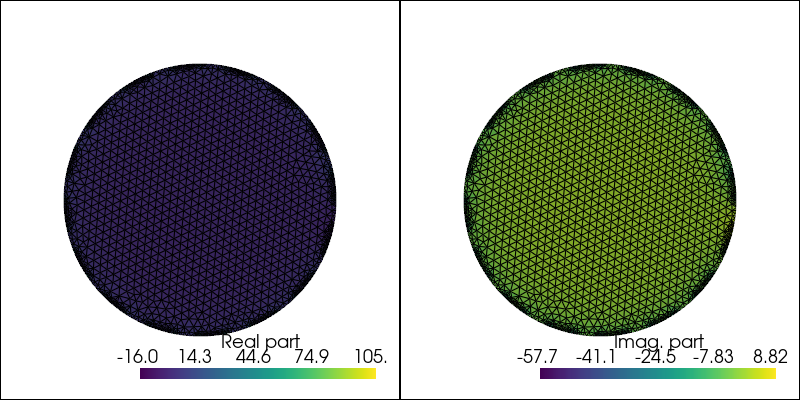

Jacobian


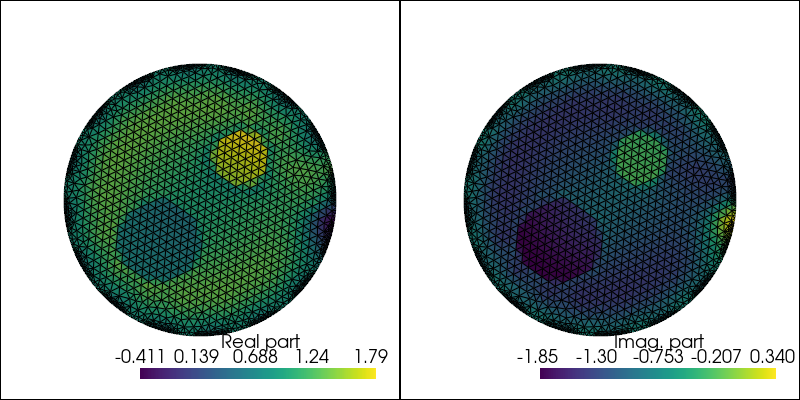

Error:


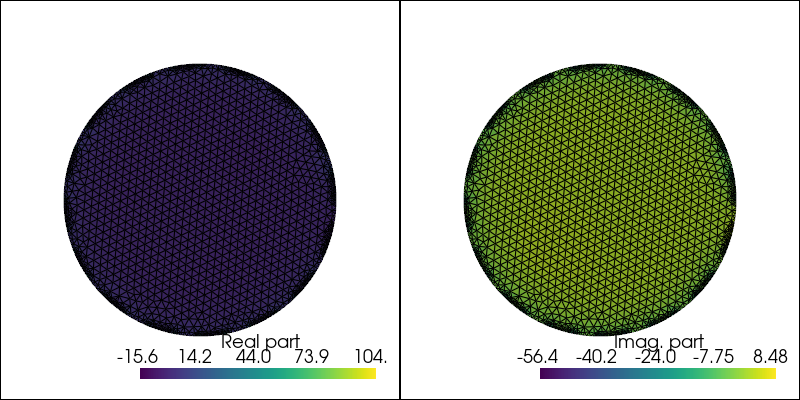

In [16]:
# using norms correction
jacobian_norms_array = np.zeros(jacobian_mat.shape[1])
for k in range(jacobian_mat.shape[1]):
    jacobian_norms_array[k] = np.linalg.norm(jacobian_mat[:,k])
    
norms_diag = np.diag(1/jacobian_norms_array)
cor_adjoint_mat = norms_diag @ adjoint_mat
adjoint_jac.x.array[:] = cor_adjoint_mat @ sigma_array

#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)

Multiplying jacobian ajoint by area array

Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.3458687685364692+13.999171285470739j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-9.178213744576169e-12-3.360156597409514e-11j)
Error norm= 3.483252565423006e-11
Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-8.025275135495241e-07+1.89808812585665e-05j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (0.3458679659997774-13.999152304623083j)
Error norm= 14.003424220451889
Variational


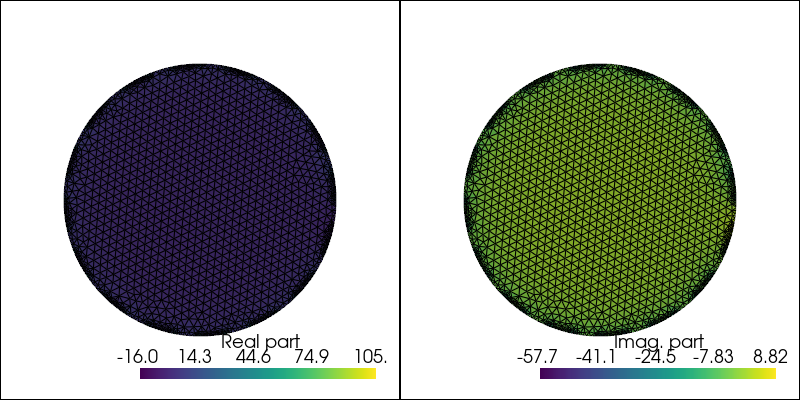

Jacobian


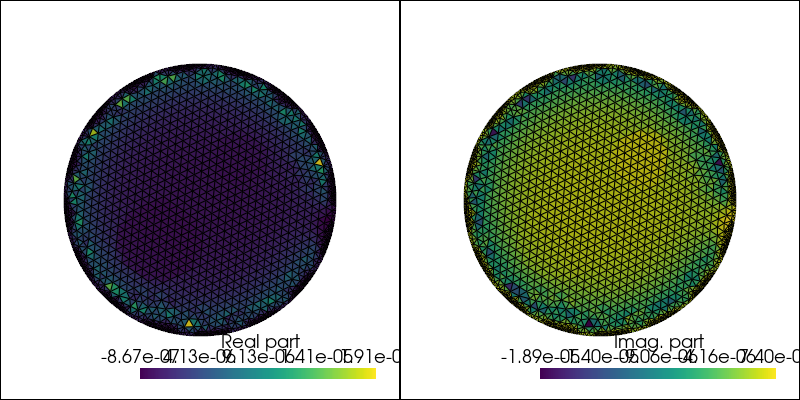

Error:


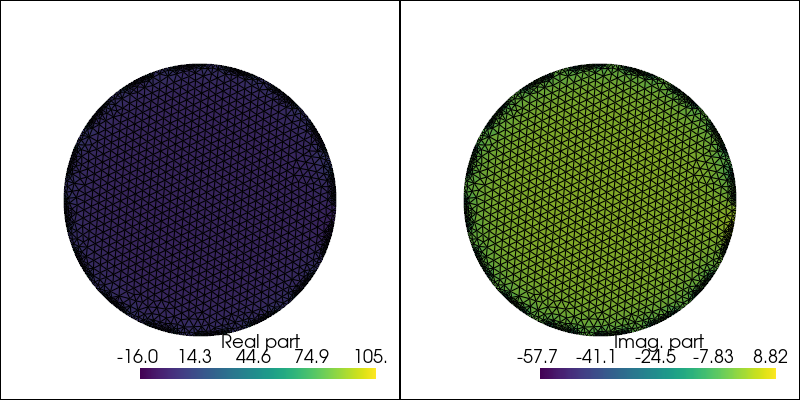

In [17]:
adjoint_jac.x.array[:] = (adjoint_mat @ sigma_array) * inv_problem.cell_area_array

#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)

Multiplying jacobian ajoint by inverse of areas array

Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.3458687685364692+13.999171285470739j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-9.178213744576169e-12-3.360156597409514e-11j)
Error norm= 3.483252565423006e-11
Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-0.345868768538891+13.999171285475114j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (-1.1599998739342254e-11-2.922639907865232e-11j)
Error norm= 3.1444274102885424e-11
Variational


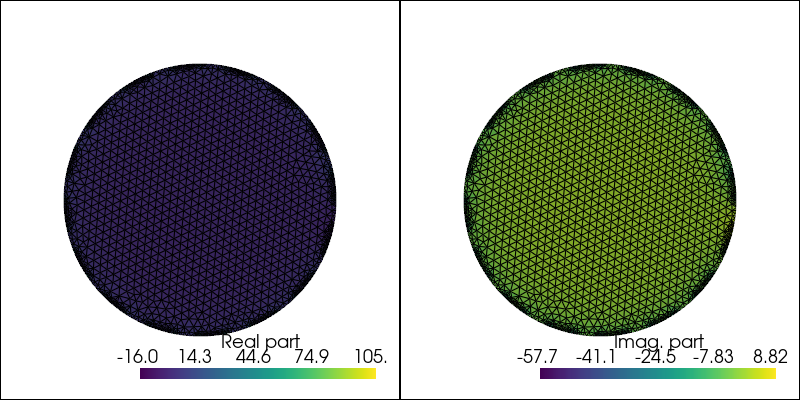

Jacobian


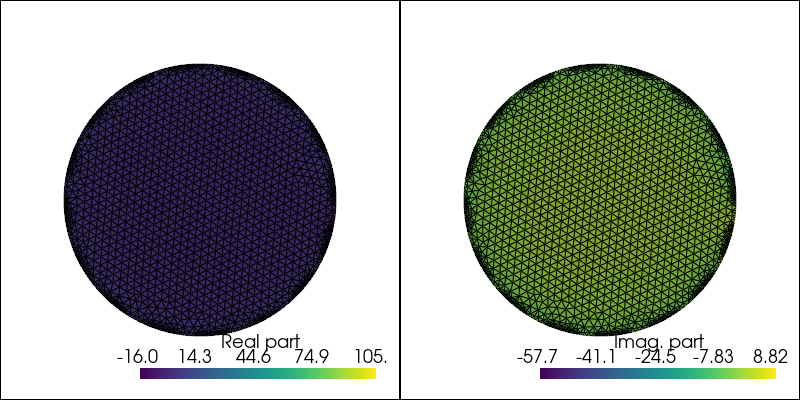

Error:


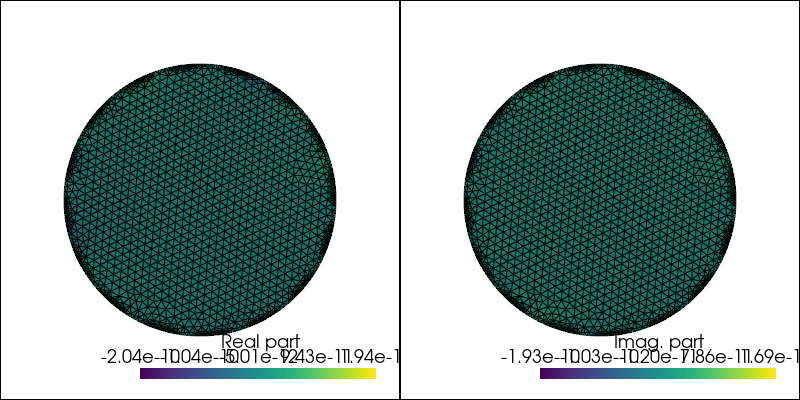

In [18]:
adjoint_jac.x.array[:] = (adjoint_mat @ sigma_array) * (1/inv_problem.cell_area_array)

#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)


Multiplying jacobian ajoint by inverse of areas array

In [19]:
adjoint_var_array = adjoint_var.x.array

Using variational adjoint
<eta, F'(gamma)* \sigma>= (-0.0005184235230014664+0.013674403818235805j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (0.3453503450042895-13.985496881686105j)
Error norm= 13.989760179804597
Using Jacobian adjoint
<eta, F'(gamma)* \sigma>= (-0.0005184235230042626+0.01367440381824137j)
< F'(gamma) \eta, \sigma>= (-0.345868768527291+13.99917128550434j)
Error= (0.34535034500428674-13.9854968816861j)
Error norm= 13.989760179804591
Variational


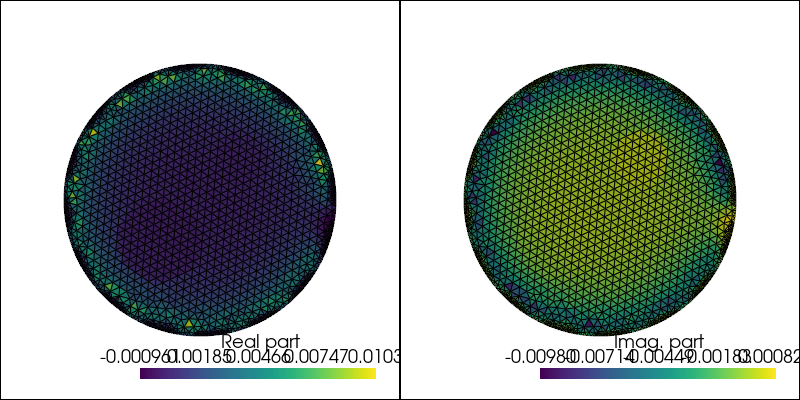

Jacobian


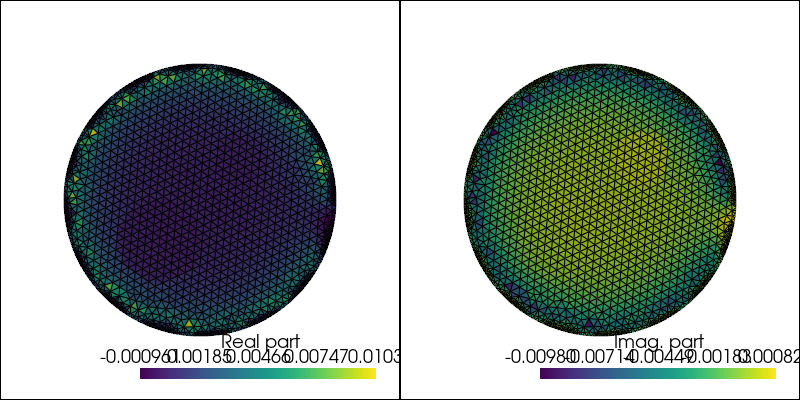

Error:


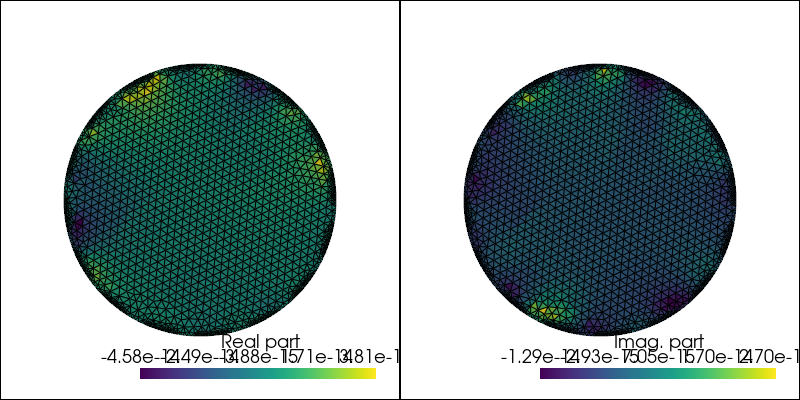

In [20]:
adjoint_var.x.array[:] = adjoint_var_array * inv_problem.cell_area_array
adjoint_jac.x.array[:] = adjoint_mat @ sigma_array

#Inner product comparison
eta = dolfinx.fem.Function(V0)
eta.x.array[:] = 1+1j
eta.x.array[200:800] = 2+2j
weta_list, Weta_list = dir_problem.directional_derivative(eta,u_list)

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_var)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using variational adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

form_p1 = dolfinx.fem.form(ufl.inner(eta, adjoint_jac)*ufl.dx)
value_p1 = dolfinx.fem.assemble_scalar(form_p1)
value_p2 = np.vdot(sigma_array, np.array(Weta_list))

print("Using Jacobian adjoint")
print("<eta, F'(gamma)* \sigma>=", value_p1)
print("< F'(gamma) \eta, \sigma>=", value_p2)
print("Error=",value_p1-value_p2)
print("Error norm=",abs(value_p1-value_p2))

print("Variational")
eitx.plot_indicator_function(adjoint_var)

print("Jacobian")
eitx.plot_indicator_function(adjoint_jac)

print("Error:")
err_function = dolfinx.fem.Function(V0)
err_function.x.array[:] = adjoint_var.x.array - adjoint_jac.x.array
eitx.plot_indicator_function(err_function)
